<a href="https://colab.research.google.com/github/Howida100/deep-learning-/blob/master/Correlation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#https://www.kaggle.com/timbaney1989/titanic-correlation-map-and-machine-learning
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [5]:
import matplotlib.pyplot as plt
%pylab inline
from google.colab import files

uploaded = files.upload()

Populating the interactive namespace from numpy and matplotlib


Saving complete combined.csv to complete combined (2).csv


In [6]:
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

User uploaded file "complete combined.csv" with length 11408868 bytes


In [7]:
#Reading data from CSV file
import pandas as pd
import numpy as np
df = pd.read_csv('complete combined.csv')
df

,Package,Category,Default : Access DRM content. (S),Default : Access Email provider data (S),Default : Access all system downloads (S),Default : Access download manager. (S),Default : Advanced download manager functions. (S),Default : Audio File Access (S),Default : Install DRM content. (S),Default : Modify Google service configuration (S),...,Your personal information : read calendar events (D),Your personal information : read contact data (D),Your personal information : read sensitive log data (D),Your personal information : read user defined dictionary (D),Your personal information : retrieve system internal state (S),Your personal information : set alarm in alarm clock (S),Your personal information : write Browser's history and bookmarks (D),Your personal information : write contact data (D),Your personal information : write to user defined dictionary (S),lablel
0,net.iconchanger,Personalization,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
1,com.Jaaru.TruthorDareFree,Comics,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
2,com.jrtstudio.iSyncr,Music & Audio,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
3,com.ftbsports.fmrm,Sports Games,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
4,com.sillycube.android.Rushing,Sports Games,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
5,com.mathpad.mobile.android.wt.unit,Tools,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
6,com.tvshowfavs,Entertainment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
7,com.AndPhone.game.DonutKungFu,Racing,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
8,com.highlycaffeinatedcode.scrabblehelper,Brain & Puzzle,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
9,com.doenter.android.vpn.fivevpn,Tools,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware


In [0]:
X = df.iloc[:,0:175]  #independent columns
y = df.iloc[:,175]    #target column i.e label(malware or not)

In [9]:
print(df.groupby('lablel').size())

lablel
malware        9999
nonmalware    18850
dtype: int64


In [10]:
#Create 2 DataFrame for each Species
malicious=df[df['lablel']=='malware']
clean =df[df['lablel']=='nonmalware']

print(malicious.describe())
print(clean.describe())


       Default : Access DRM content. (S)  \
count                             9999.0   
mean                                 0.0   
std                                  0.0   
min                                  0.0   
25%                                  0.0   
50%                                  0.0   
75%                                  0.0   
max                                  0.0   

       Default : Access Email provider data (S)  \
count                               9999.000000   
mean                                   0.003400   
std                                    0.058216   
min                                    0.000000   
25%                                    0.000000   
50%                                    0.000000   
75%                                    0.000000   
max                                    1.000000   

       Default : Access all system downloads (S)  \
count                                9999.000000   
mean                                   

In [11]:
print(df.describe())

       Default : Access DRM content. (S)  \
count                       28849.000000   
mean                            0.006898   
std                             0.082769   
min                             0.000000   
25%                             0.000000   
50%                             0.000000   
75%                             0.000000   
max                             1.000000   

       Default : Access Email provider data (S)  \
count                              28849.000000   
mean                                   0.005026   
std                                    0.070718   
min                                    0.000000   
25%                                    0.000000   
50%                                    0.000000   
75%                                    0.000000   
max                                    1.000000   

       Default : Access all system downloads (S)  \
count                               28849.000000   
mean                                   

In [12]:
df

,Package,Category,Default : Access DRM content. (S),Default : Access Email provider data (S),Default : Access all system downloads (S),Default : Access download manager. (S),Default : Advanced download manager functions. (S),Default : Audio File Access (S),Default : Install DRM content. (S),Default : Modify Google service configuration (S),...,Your personal information : read calendar events (D),Your personal information : read contact data (D),Your personal information : read sensitive log data (D),Your personal information : read user defined dictionary (D),Your personal information : retrieve system internal state (S),Your personal information : set alarm in alarm clock (S),Your personal information : write Browser's history and bookmarks (D),Your personal information : write contact data (D),Your personal information : write to user defined dictionary (S),lablel
0,net.iconchanger,Personalization,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
1,com.Jaaru.TruthorDareFree,Comics,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
2,com.jrtstudio.iSyncr,Music & Audio,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
3,com.ftbsports.fmrm,Sports Games,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
4,com.sillycube.android.Rushing,Sports Games,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
5,com.mathpad.mobile.android.wt.unit,Tools,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
6,com.tvshowfavs,Entertainment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
7,com.AndPhone.game.DonutKungFu,Racing,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
8,com.highlycaffeinatedcode.scrabblehelper,Brain & Puzzle,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware
9,com.doenter.android.vpn.fivevpn,Tools,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,malware


In [0]:
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

%matplotlib inline
pylab.rcParams[ 'figure.figsize' ] = 90 , 90

from sklearn import datasets
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.model_selection import train_test_split

import seaborn as sns

plt.style.use("ggplot")

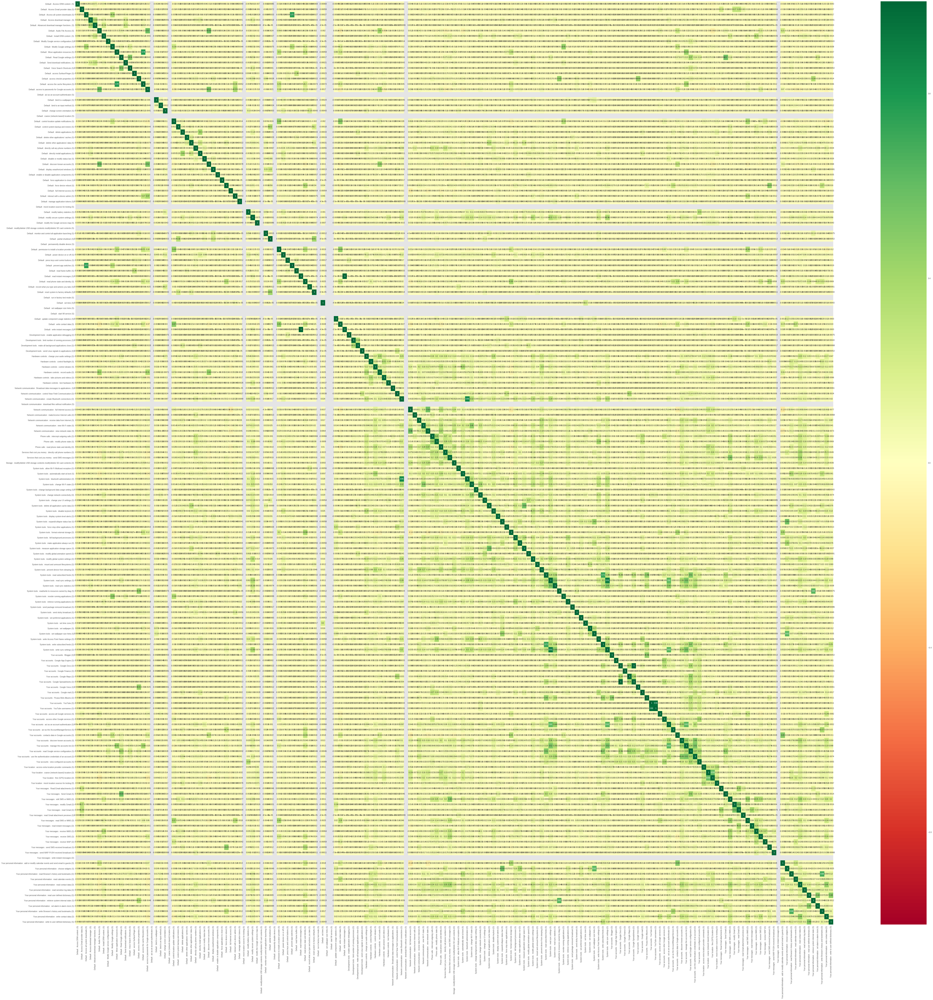

In [14]:
def df_corr(df):
    correlation = df.corr()
    sns.heatmap(correlation, annot=True, cbar=True, cmap="RdYlGn")
    
    
df_corr(df)

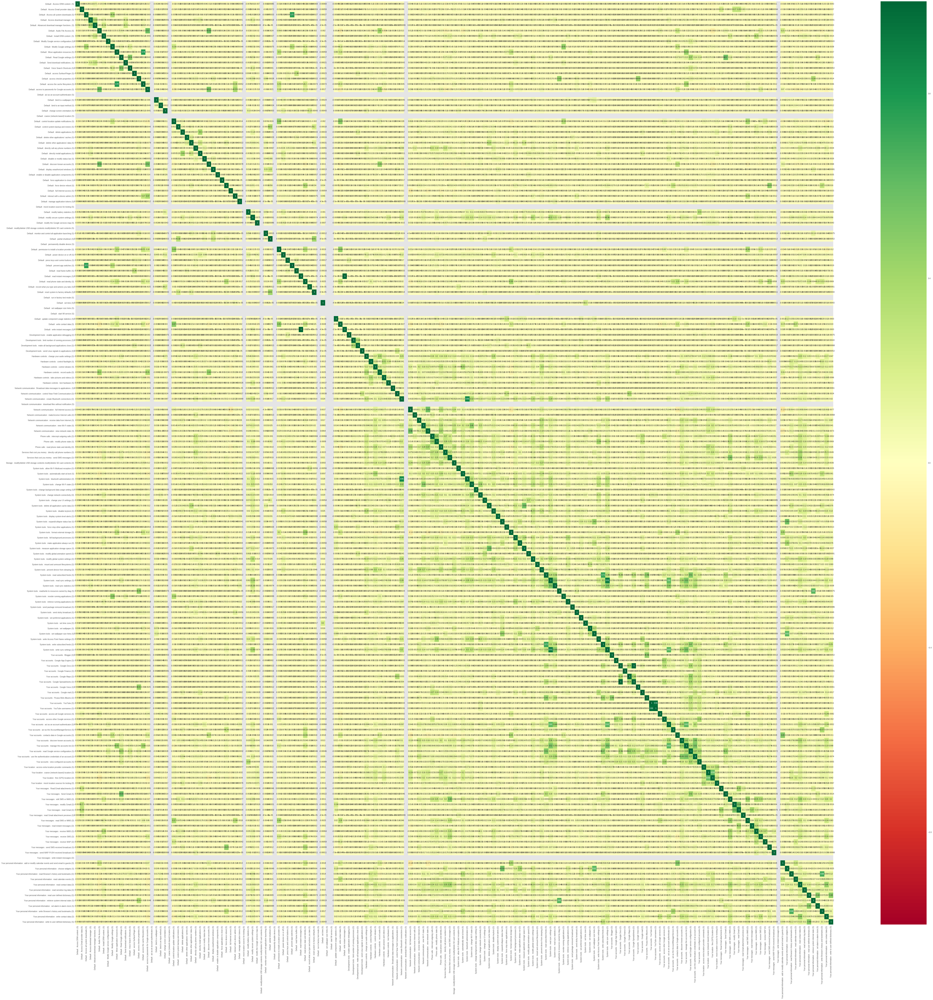

In [28]:
import pandas as pd
import numpy as np
import seaborn as sns
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(90,90))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [0]:
#https://towardsdatascience.com/feature-selection-correlation-and-p-value-da8921bfb3cf
#python code for identify correlation of features dataset
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
np.random.seed(123)

In [0]:
corr = df.corr()

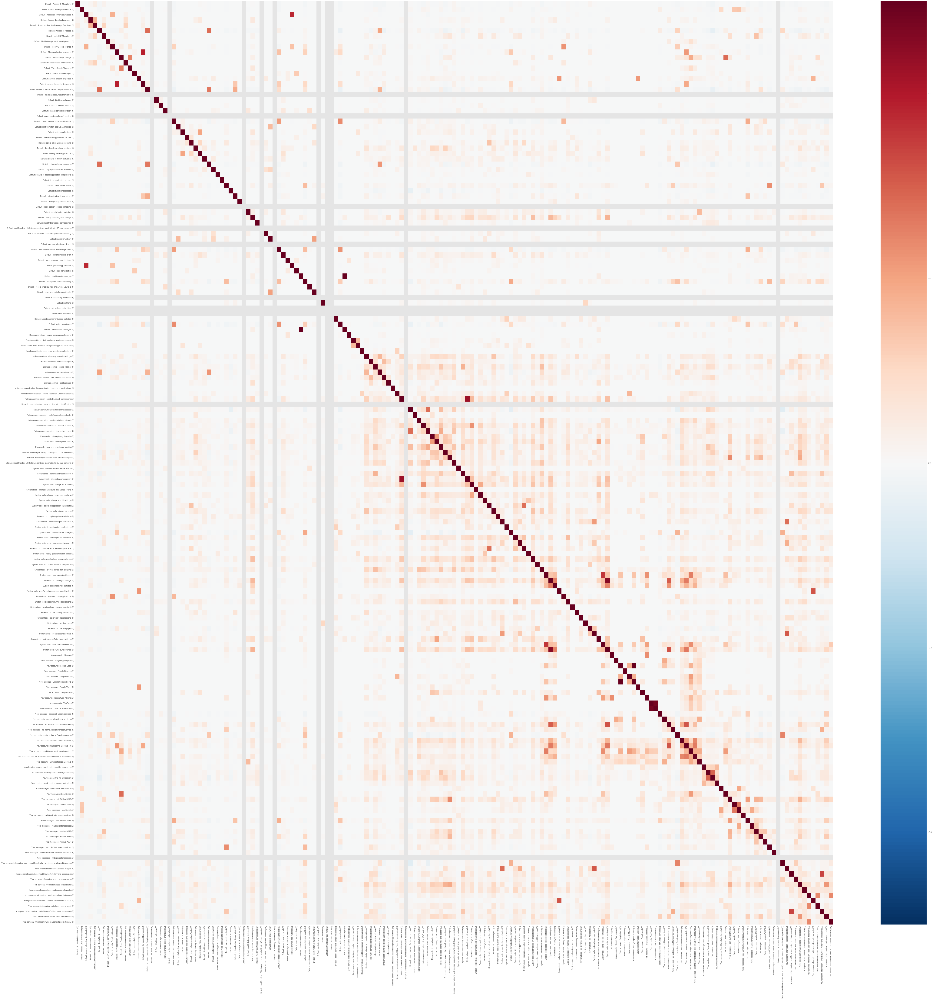

In [18]:
sns.heatmap(corr)

In [0]:
from sklearn.ensemble import ExtraTreesClassifier
>>> from sklearn.datasets import load_iris
>>> from sklearn.feature_selection import SelectFromModel
>>> iris = load_iris()
>>> X, y = iris.data, iris.target
>>> X.shape
(150, 4)
>>> clf = ExtraTreesClassifier(n_estimators=50)
>>> clf = clf.fit(X, y)
>>> clf.feature_importances_  
array([ 0.04...,  0.05...,  0.4...,  0.4...])
>>> model = SelectFromModel(clf, prefit=True)
>>> X_new = model.transform(X)
>>> X_new.shape               
(150, 2)

SyntaxError: ignored

In [0]:
import numpy as np

np.random.seed(1)

In [0]:
np.corrcoef(X, y)

ValueError: ignored

In [0]:
df.identify_collinear(correlation_threshold = 0.98)

AttributeError: ignored